## 1. Import Libraries

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np

___

## 2. Device configuration

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


___

## 3. Hyperparameters

In [8]:
batch_size = 128
image_size = 64  # DCGAN typically uses 64x64 images
nz = 100         # Size of z latent vector (noise)
ngf = 64         # Size of feature maps in generator
ndf = 64         # Size of feature maps in discriminator
num_epochs = 25
lr = 0.0002
beta1 = 0.5      # Beta1 hyperparam for Adam optimizers

___

## 4. Prepare the Dataset

In [10]:
# Transformations applied to the dataset
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # Normalize to [-1, 1]
])

In [11]:
# Load MNIST dataset as example (to generate 1-channel images)
dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)

In [12]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

___

## 5. Define the Generator

In [13]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # Input: Z latent vector nz x 1 x 1
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),  # 8x8
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),  # 16x16
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),      # 32x32
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf, 1, 4, 2, 1, bias=False),           # 64x64 output, 1 channel
            nn.Tanh()  # Output in range [-1,1]
        )

    def forward(self, input):
        return self.main(input)

___

## 6. Define the Discriminator network

In [14]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Input: 1 x 64 x 64 image
            nn.Conv2d(1, ndf, 4, 2, 1, bias=False),   # 32x32
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False), # 16x16
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False), # 8x8
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False), # 4x4
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False), # Output 1x1x1
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input).view(-1, 1).squeeze(1)  # Flatten output

___

## 7. Initialize models

In [15]:
netG = Generator().to(device)
netD = Discriminator().to(device)

___

## 8. Initialize BCELoss function

In [17]:
criterion = nn.BCELoss()

___

## 9.Setup optimizers

In [18]:
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

___

## 10. Function to initialize model weights

In [19]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [20]:
netG.apply(weights_init)
netD.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

____

## 11. Labels

In [22]:
real_label = 1.
fake_label = 0.

____

## 12. Fixed noise for visualization

In [23]:
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

___

## 13. Training Loop

[1/25][0/469] Loss_D: 1.4767 Loss_G: 5.6556 D(x): 0.6665 D(G(z)): 0.5596 / 0.0061
[1/25][100/469] Loss_D: 0.0278 Loss_G: 8.0100 D(x): 0.9911 D(G(z)): 0.0184 / 0.0004
[1/25][200/469] Loss_D: 0.0648 Loss_G: 5.0066 D(x): 0.9545 D(G(z)): 0.0152 / 0.0099
[1/25][300/469] Loss_D: 1.0880 Loss_G: 6.9821 D(x): 0.9084 D(G(z)): 0.5327 / 0.0017
[1/25][400/469] Loss_D: 0.3078 Loss_G: 2.6870 D(x): 0.8491 D(G(z)): 0.1127 / 0.0974


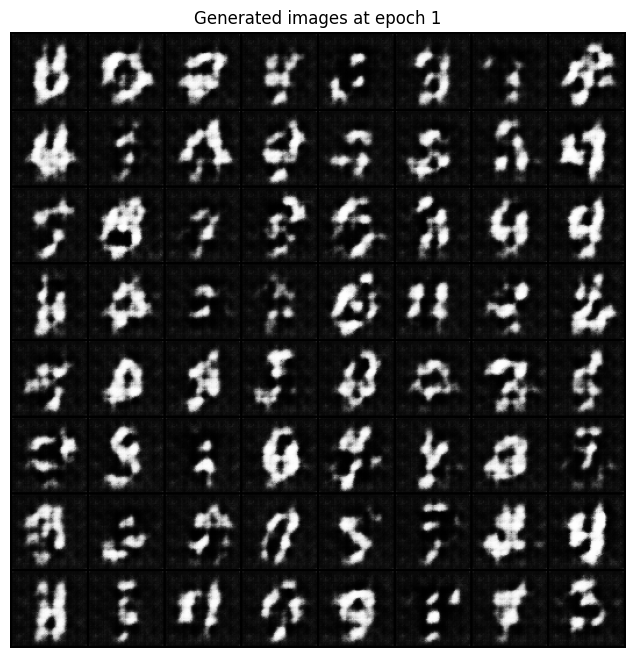

[2/25][0/469] Loss_D: 1.7581 Loss_G: 1.9429 D(x): 0.2616 D(G(z)): 0.0203 / 0.2377
[2/25][100/469] Loss_D: 0.3042 Loss_G: 2.9091 D(x): 0.9032 D(G(z)): 0.1709 / 0.0720
[2/25][200/469] Loss_D: 0.4060 Loss_G: 2.0960 D(x): 0.8068 D(G(z)): 0.1498 / 0.1468
[2/25][300/469] Loss_D: 0.9671 Loss_G: 2.3567 D(x): 0.8284 D(G(z)): 0.4914 / 0.1280
[2/25][400/469] Loss_D: 0.3936 Loss_G: 3.3094 D(x): 0.9317 D(G(z)): 0.2615 / 0.0453


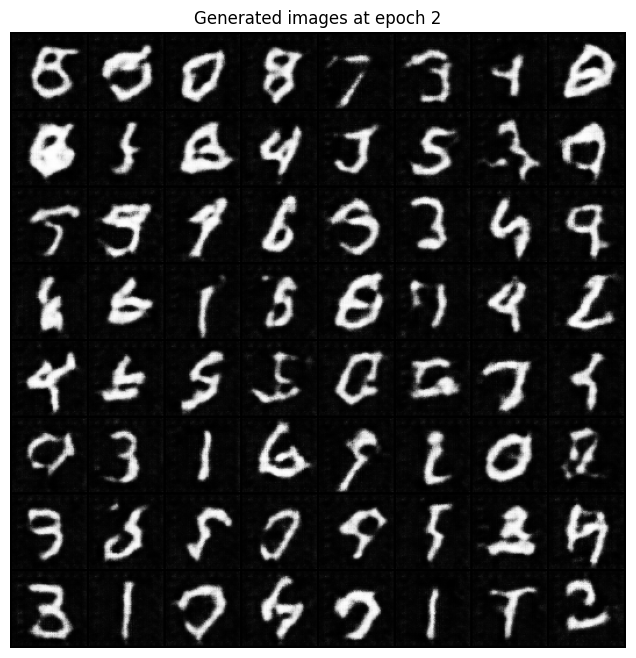

[3/25][0/469] Loss_D: 0.3363 Loss_G: 2.9108 D(x): 0.9119 D(G(z)): 0.2007 / 0.0688
[3/25][100/469] Loss_D: 0.4005 Loss_G: 2.5142 D(x): 0.8615 D(G(z)): 0.2057 / 0.0987
[3/25][200/469] Loss_D: 0.6778 Loss_G: 1.7968 D(x): 0.7061 D(G(z)): 0.2389 / 0.1967
[3/25][300/469] Loss_D: 0.2654 Loss_G: 2.9964 D(x): 0.9114 D(G(z)): 0.1473 / 0.0632
[3/25][400/469] Loss_D: 0.5753 Loss_G: 2.5176 D(x): 0.8615 D(G(z)): 0.3138 / 0.1071


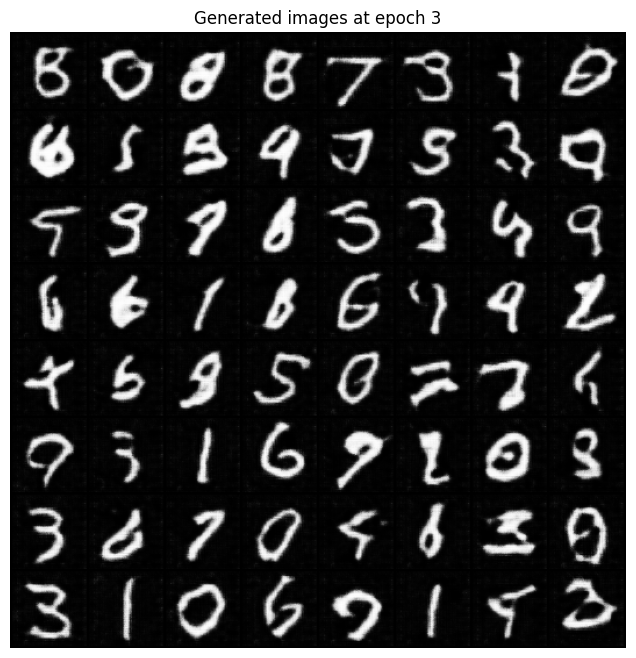

[4/25][0/469] Loss_D: 0.3353 Loss_G: 2.1624 D(x): 0.7757 D(G(z)): 0.0540 / 0.1439
[4/25][100/469] Loss_D: 0.3739 Loss_G: 3.4468 D(x): 0.8902 D(G(z)): 0.2108 / 0.0390
[4/25][200/469] Loss_D: 3.2240 Loss_G: 1.1329 D(x): 0.1548 D(G(z)): 0.0950 / 0.4664
[4/25][300/469] Loss_D: 0.1444 Loss_G: 3.3156 D(x): 0.9363 D(G(z)): 0.0695 / 0.0523
[4/25][400/469] Loss_D: 0.6109 Loss_G: 2.8948 D(x): 0.7204 D(G(z)): 0.1999 / 0.0761


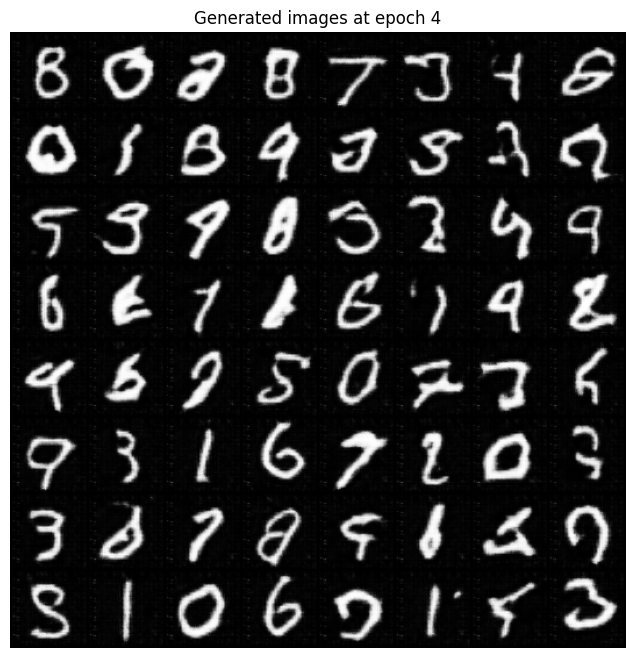

[5/25][0/469] Loss_D: 0.0868 Loss_G: 4.0491 D(x): 0.9537 D(G(z)): 0.0368 / 0.0253
[5/25][100/469] Loss_D: 0.3069 Loss_G: 2.7599 D(x): 0.8550 D(G(z)): 0.1150 / 0.0877
[5/25][200/469] Loss_D: 0.4226 Loss_G: 5.3065 D(x): 0.8999 D(G(z)): 0.2449 / 0.0070
[5/25][300/469] Loss_D: 0.2279 Loss_G: 5.0781 D(x): 0.9849 D(G(z)): 0.1812 / 0.0083
[5/25][400/469] Loss_D: 0.3582 Loss_G: 3.4552 D(x): 0.8527 D(G(z)): 0.1613 / 0.0412


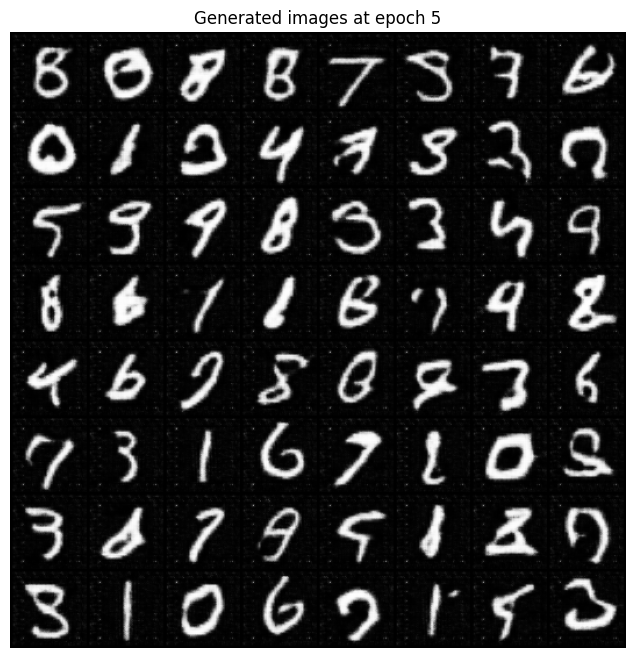

[6/25][0/469] Loss_D: 0.0922 Loss_G: 3.9894 D(x): 0.9315 D(G(z)): 0.0181 / 0.0302
[6/25][100/469] Loss_D: 0.1809 Loss_G: 3.1154 D(x): 0.9693 D(G(z)): 0.1292 / 0.0637
[6/25][200/469] Loss_D: 0.0799 Loss_G: 4.0525 D(x): 0.9600 D(G(z)): 0.0364 / 0.0251
[6/25][300/469] Loss_D: 1.2017 Loss_G: 1.1552 D(x): 0.3702 D(G(z)): 0.0386 / 0.3718
[6/25][400/469] Loss_D: 0.7407 Loss_G: 1.6800 D(x): 0.5313 D(G(z)): 0.0015 / 0.2636


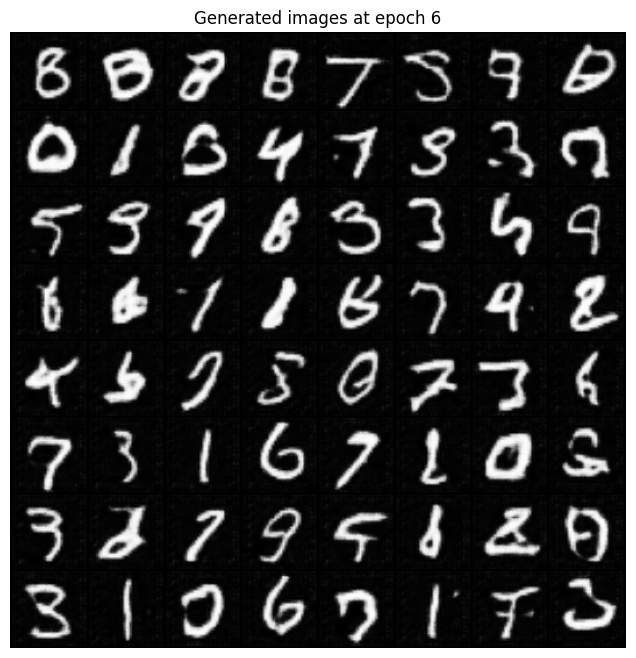

[7/25][0/469] Loss_D: 0.3849 Loss_G: 2.0058 D(x): 0.7449 D(G(z)): 0.0468 / 0.1848
[7/25][100/469] Loss_D: 2.5156 Loss_G: 1.8291 D(x): 0.1317 D(G(z)): 0.0027 / 0.2366
[7/25][200/469] Loss_D: 0.0816 Loss_G: 3.4835 D(x): 0.9503 D(G(z)): 0.0277 / 0.0450
[7/25][300/469] Loss_D: 2.6763 Loss_G: 0.3664 D(x): 0.1369 D(G(z)): 0.0081 / 0.7495
[7/25][400/469] Loss_D: 0.2709 Loss_G: 3.4832 D(x): 0.8934 D(G(z)): 0.1349 / 0.0470


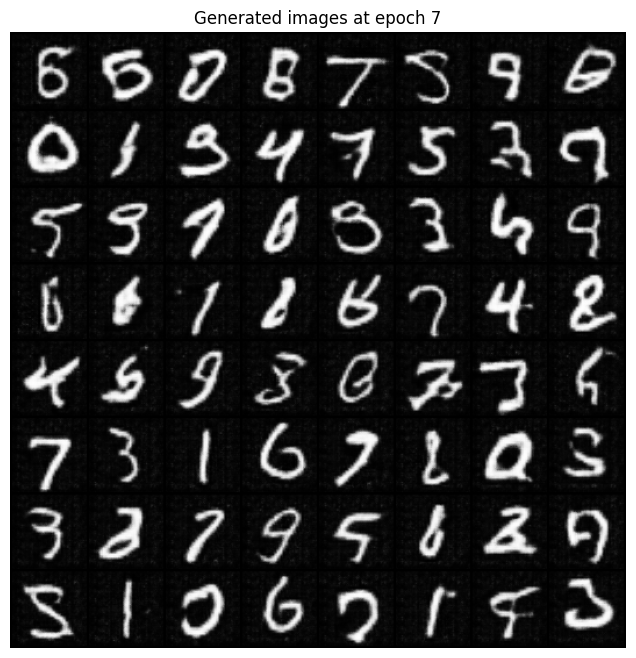

[8/25][0/469] Loss_D: 0.3873 Loss_G: 2.9086 D(x): 0.8763 D(G(z)): 0.2018 / 0.0783
[8/25][100/469] Loss_D: 0.4769 Loss_G: 2.3873 D(x): 0.7723 D(G(z)): 0.1610 / 0.1247
[8/25][200/469] Loss_D: 0.2720 Loss_G: 4.5393 D(x): 0.9484 D(G(z)): 0.1800 / 0.0143
[8/25][300/469] Loss_D: 0.6085 Loss_G: 1.9218 D(x): 0.6474 D(G(z)): 0.0926 / 0.1944
[8/25][400/469] Loss_D: 0.4253 Loss_G: 3.5521 D(x): 0.7821 D(G(z)): 0.1243 / 0.0427


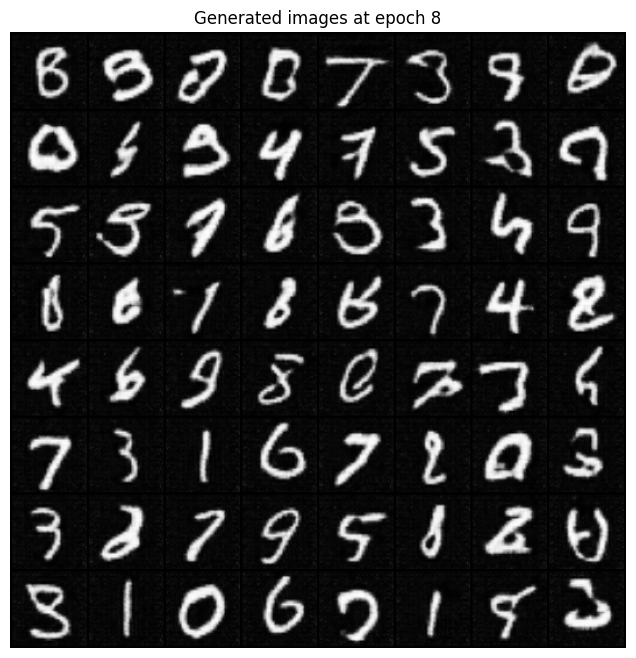

[9/25][0/469] Loss_D: 0.0707 Loss_G: 4.2202 D(x): 0.9708 D(G(z)): 0.0391 / 0.0211
[9/25][100/469] Loss_D: 0.3785 Loss_G: 2.6667 D(x): 0.8151 D(G(z)): 0.1342 / 0.0948
[9/25][200/469] Loss_D: 0.0542 Loss_G: 3.9519 D(x): 0.9621 D(G(z)): 0.0145 / 0.0305
[9/25][300/469] Loss_D: 2.2700 Loss_G: 0.1080 D(x): 0.1703 D(G(z)): 0.0055 / 0.9104
[9/25][400/469] Loss_D: 0.5302 Loss_G: 2.6135 D(x): 0.8253 D(G(z)): 0.2435 / 0.1013


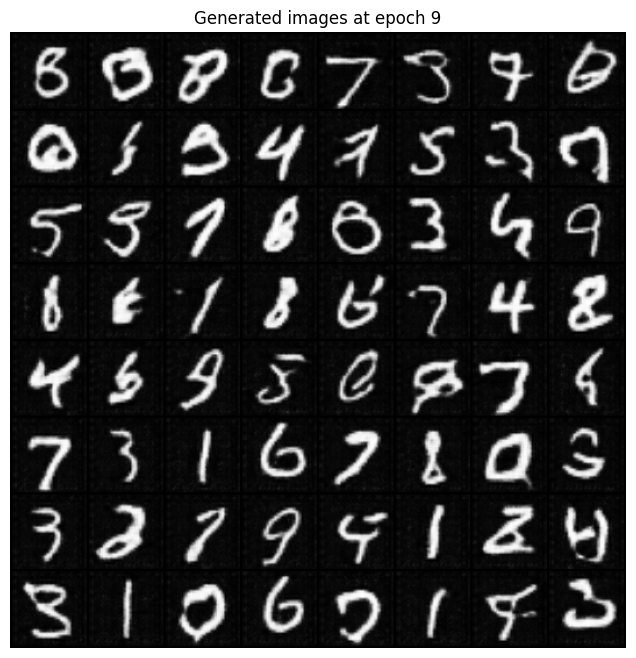

[10/25][0/469] Loss_D: 0.3921 Loss_G: 2.5856 D(x): 0.8083 D(G(z)): 0.1411 / 0.0996
[10/25][100/469] Loss_D: 1.3096 Loss_G: 1.2572 D(x): 0.3572 D(G(z)): 0.0203 / 0.3970
[10/25][200/469] Loss_D: 0.0710 Loss_G: 4.1671 D(x): 0.9569 D(G(z)): 0.0232 / 0.0234
[10/25][300/469] Loss_D: 0.2779 Loss_G: 2.0764 D(x): 0.8424 D(G(z)): 0.0837 / 0.1529
[10/25][400/469] Loss_D: 1.2786 Loss_G: 7.8084 D(x): 0.9954 D(G(z)): 0.6396 / 0.0008


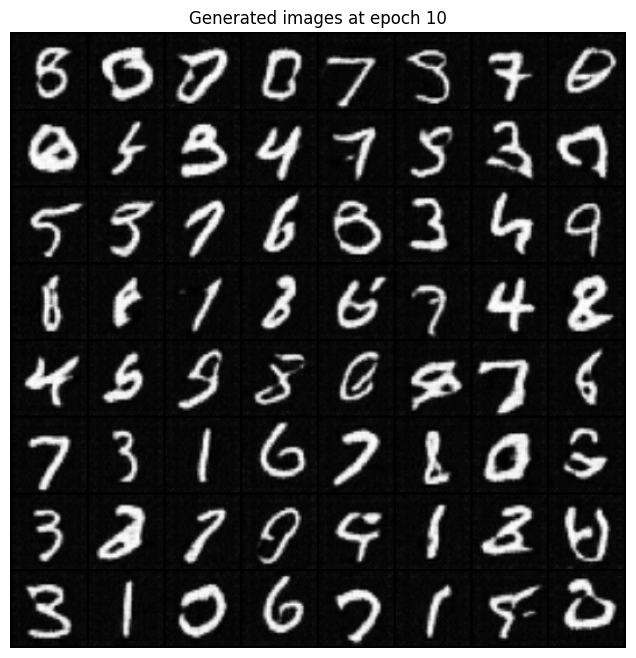

[11/25][0/469] Loss_D: 0.1156 Loss_G: 4.0392 D(x): 0.9713 D(G(z)): 0.0783 / 0.0263
[11/25][100/469] Loss_D: 0.0607 Loss_G: 4.7036 D(x): 0.9781 D(G(z)): 0.0367 / 0.0130
[11/25][200/469] Loss_D: 0.6523 Loss_G: 2.7717 D(x): 0.8386 D(G(z)): 0.3387 / 0.0796
[11/25][300/469] Loss_D: 0.3138 Loss_G: 2.9220 D(x): 0.8280 D(G(z)): 0.1004 / 0.0782
[11/25][400/469] Loss_D: 0.1071 Loss_G: 3.7003 D(x): 0.9420 D(G(z)): 0.0434 / 0.0362


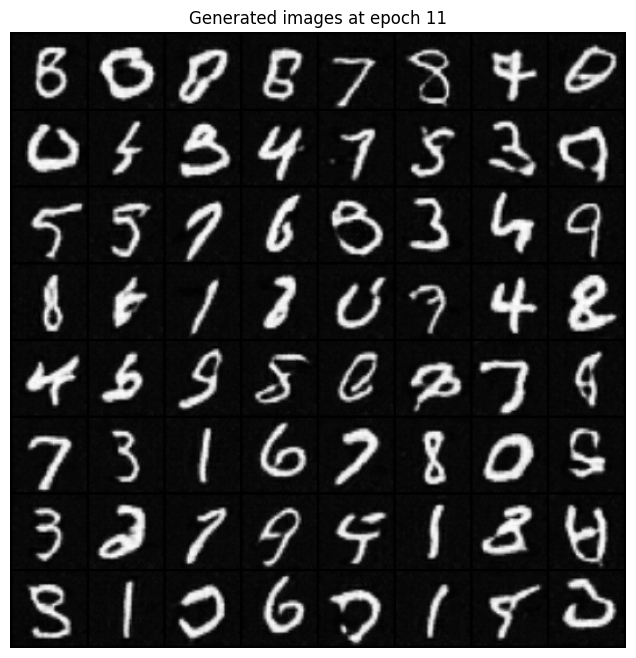

[12/25][0/469] Loss_D: 0.1653 Loss_G: 3.1854 D(x): 0.9330 D(G(z)): 0.0858 / 0.0623
[12/25][100/469] Loss_D: 1.3302 Loss_G: 0.9526 D(x): 0.5503 D(G(z)): 0.4913 / 0.4061
[12/25][200/469] Loss_D: 1.1862 Loss_G: 0.9808 D(x): 0.5402 D(G(z)): 0.3758 / 0.4104
[12/25][300/469] Loss_D: 0.5666 Loss_G: 2.9312 D(x): 0.8302 D(G(z)): 0.2865 / 0.0683
[12/25][400/469] Loss_D: 0.4527 Loss_G: 3.1990 D(x): 0.8561 D(G(z)): 0.2378 / 0.0551


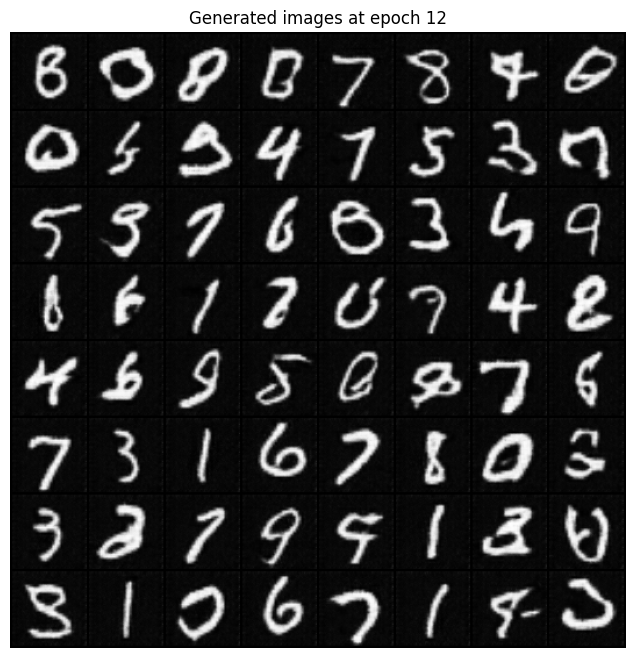

[13/25][0/469] Loss_D: 0.1097 Loss_G: 3.7939 D(x): 0.9360 D(G(z)): 0.0396 / 0.0311
[13/25][100/469] Loss_D: 1.2329 Loss_G: 1.3313 D(x): 0.3619 D(G(z)): 0.0087 / 0.3244
[13/25][200/469] Loss_D: 0.0740 Loss_G: 3.6387 D(x): 0.9653 D(G(z)): 0.0365 / 0.0382
[13/25][300/469] Loss_D: 0.7743 Loss_G: 1.6935 D(x): 0.5447 D(G(z)): 0.0733 / 0.2419
[13/25][400/469] Loss_D: 0.3735 Loss_G: 3.0125 D(x): 0.8423 D(G(z)): 0.1498 / 0.0760


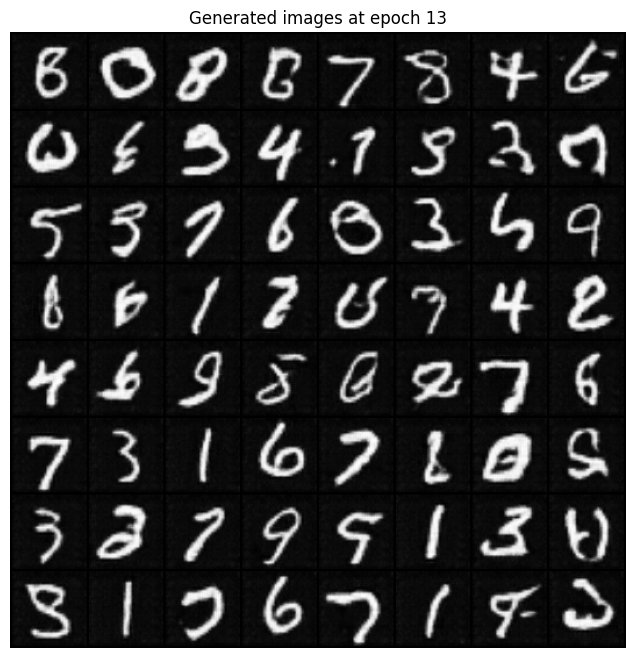

[14/25][0/469] Loss_D: 0.5933 Loss_G: 2.8348 D(x): 0.7723 D(G(z)): 0.2274 / 0.0869
[14/25][100/469] Loss_D: 0.6702 Loss_G: 2.4653 D(x): 0.8501 D(G(z)): 0.3693 / 0.1048
[14/25][200/469] Loss_D: 0.6239 Loss_G: 1.8830 D(x): 0.6973 D(G(z)): 0.1844 / 0.1910
[14/25][300/469] Loss_D: 0.0425 Loss_G: 4.3464 D(x): 0.9826 D(G(z)): 0.0241 / 0.0188
[14/25][400/469] Loss_D: 1.1456 Loss_G: 1.2518 D(x): 0.6567 D(G(z)): 0.4798 / 0.3121


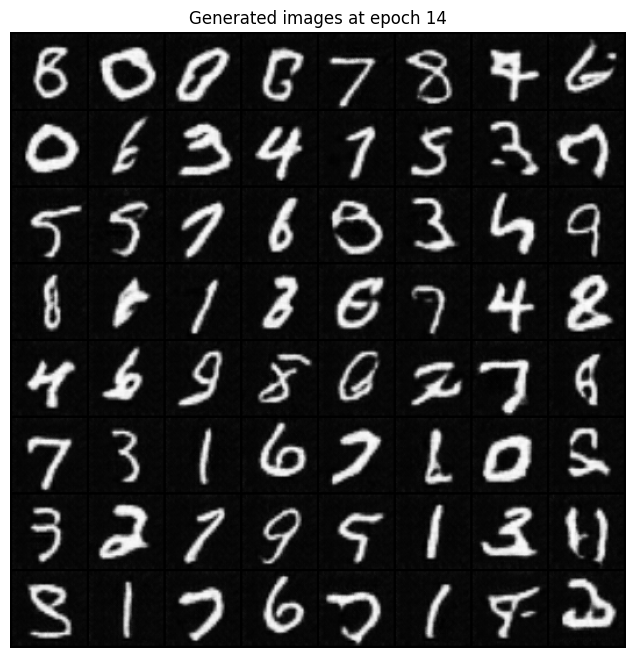

[15/25][0/469] Loss_D: 0.9278 Loss_G: 0.6583 D(x): 0.4600 D(G(z)): 0.0332 / 0.5807
[15/25][100/469] Loss_D: 0.2961 Loss_G: 4.3295 D(x): 0.9610 D(G(z)): 0.2022 / 0.0201
[15/25][200/469] Loss_D: 0.4381 Loss_G: 2.1308 D(x): 0.7859 D(G(z)): 0.1482 / 0.1534
[15/25][300/469] Loss_D: 0.0699 Loss_G: 4.3021 D(x): 0.9561 D(G(z)): 0.0237 / 0.0209
[15/25][400/469] Loss_D: 0.3903 Loss_G: 2.9131 D(x): 0.8861 D(G(z)): 0.2157 / 0.0738


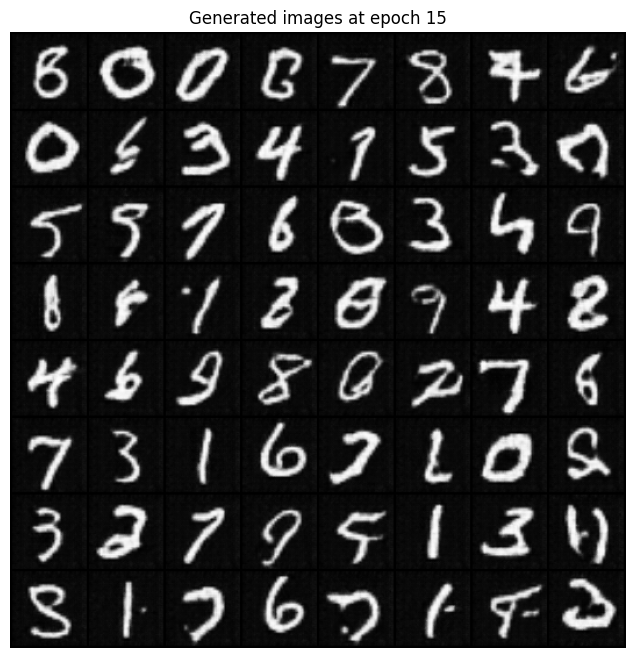

[16/25][0/469] Loss_D: 0.8541 Loss_G: 5.7160 D(x): 0.9904 D(G(z)): 0.5176 / 0.0047
[16/25][100/469] Loss_D: 0.5627 Loss_G: 2.1408 D(x): 0.9372 D(G(z)): 0.3446 / 0.1518
[16/25][200/469] Loss_D: 1.1385 Loss_G: 2.1637 D(x): 0.5831 D(G(z)): 0.3724 / 0.1512
[16/25][300/469] Loss_D: 0.0524 Loss_G: 3.8753 D(x): 0.9806 D(G(z)): 0.0317 / 0.0284
[16/25][400/469] Loss_D: 0.8518 Loss_G: 2.5874 D(x): 0.8324 D(G(z)): 0.4518 / 0.0955


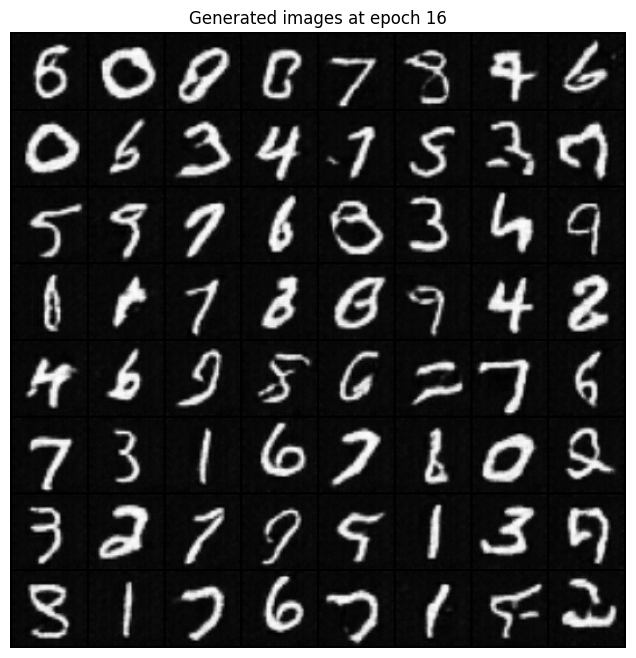

[17/25][0/469] Loss_D: 0.3705 Loss_G: 2.5152 D(x): 0.8279 D(G(z)): 0.1423 / 0.1050
[17/25][100/469] Loss_D: 0.6667 Loss_G: 1.7475 D(x): 0.8686 D(G(z)): 0.3535 / 0.2214
[17/25][200/469] Loss_D: 0.0826 Loss_G: 3.9679 D(x): 0.9582 D(G(z)): 0.0375 / 0.0282
[17/25][300/469] Loss_D: 0.0882 Loss_G: 3.8607 D(x): 0.9798 D(G(z)): 0.0631 / 0.0311
[17/25][400/469] Loss_D: 0.0366 Loss_G: 4.8637 D(x): 0.9850 D(G(z)): 0.0210 / 0.0111


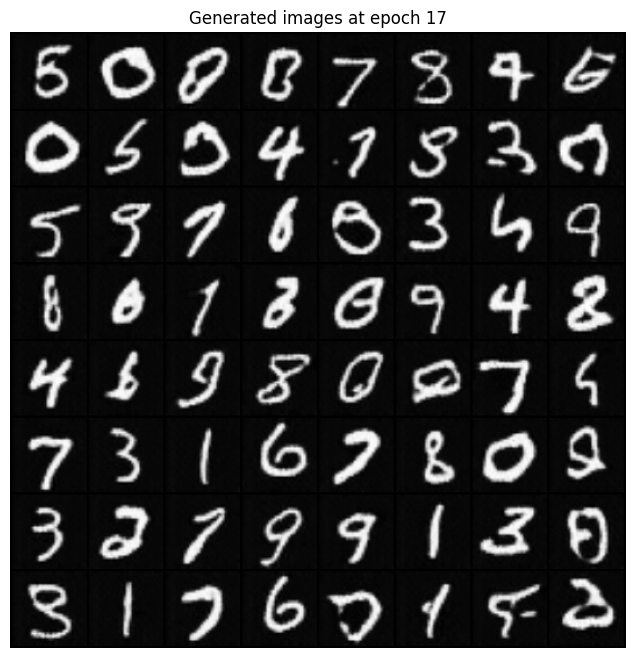

[18/25][0/469] Loss_D: 0.0353 Loss_G: 4.7969 D(x): 0.9820 D(G(z)): 0.0167 / 0.0118
[18/25][100/469] Loss_D: 1.0879 Loss_G: 1.1567 D(x): 0.5793 D(G(z)): 0.3363 / 0.3593
[18/25][200/469] Loss_D: 1.1609 Loss_G: 3.1758 D(x): 0.9154 D(G(z)): 0.5924 / 0.0596
[18/25][300/469] Loss_D: 0.4631 Loss_G: 3.0745 D(x): 0.8666 D(G(z)): 0.2453 / 0.0630
[18/25][400/469] Loss_D: 0.8876 Loss_G: 1.1142 D(x): 0.5287 D(G(z)): 0.0939 / 0.3824


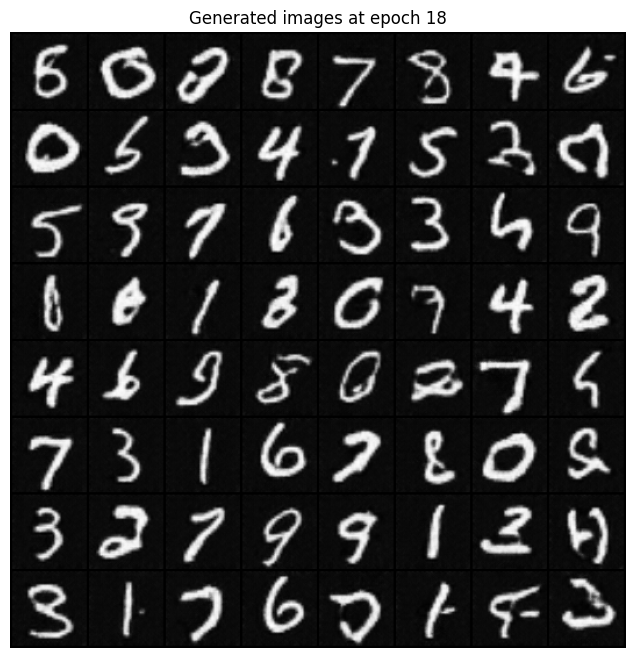

[19/25][0/469] Loss_D: 0.1269 Loss_G: 3.7027 D(x): 0.9377 D(G(z)): 0.0555 / 0.0351
[19/25][100/469] Loss_D: 1.2429 Loss_G: 4.1528 D(x): 0.9455 D(G(z)): 0.6027 / 0.0253
[19/25][200/469] Loss_D: 0.0508 Loss_G: 4.5768 D(x): 0.9639 D(G(z)): 0.0130 / 0.0155
[19/25][300/469] Loss_D: 0.5776 Loss_G: 1.6804 D(x): 0.6996 D(G(z)): 0.1591 / 0.2270
[19/25][400/469] Loss_D: 0.6915 Loss_G: 6.7652 D(x): 0.9936 D(G(z)): 0.4410 / 0.0018


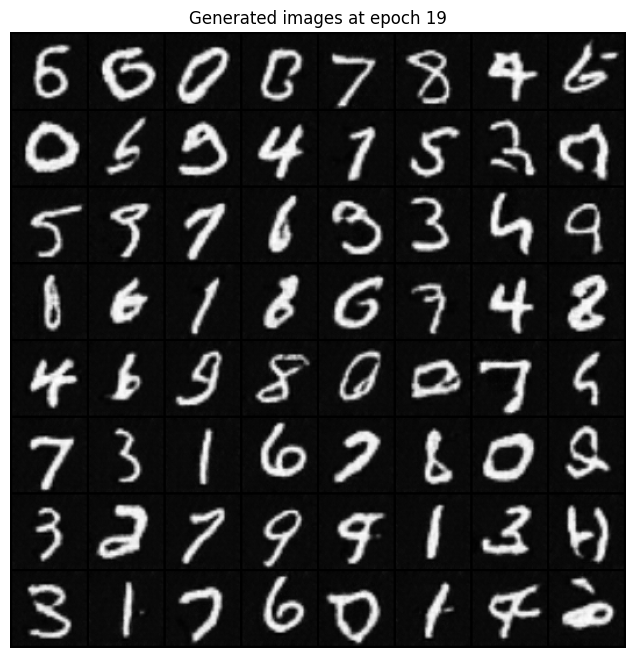

[20/25][0/469] Loss_D: 0.0707 Loss_G: 4.0247 D(x): 0.9499 D(G(z)): 0.0175 / 0.0254
[20/25][100/469] Loss_D: 0.0322 Loss_G: 4.7967 D(x): 0.9900 D(G(z)): 0.0217 / 0.0125
[20/25][200/469] Loss_D: 0.0235 Loss_G: 5.6653 D(x): 0.9847 D(G(z)): 0.0078 / 0.0054
[20/25][300/469] Loss_D: 1.1142 Loss_G: 1.1260 D(x): 0.5747 D(G(z)): 0.3821 / 0.3576
[20/25][400/469] Loss_D: 0.6944 Loss_G: 2.4953 D(x): 0.8182 D(G(z)): 0.3423 / 0.1039


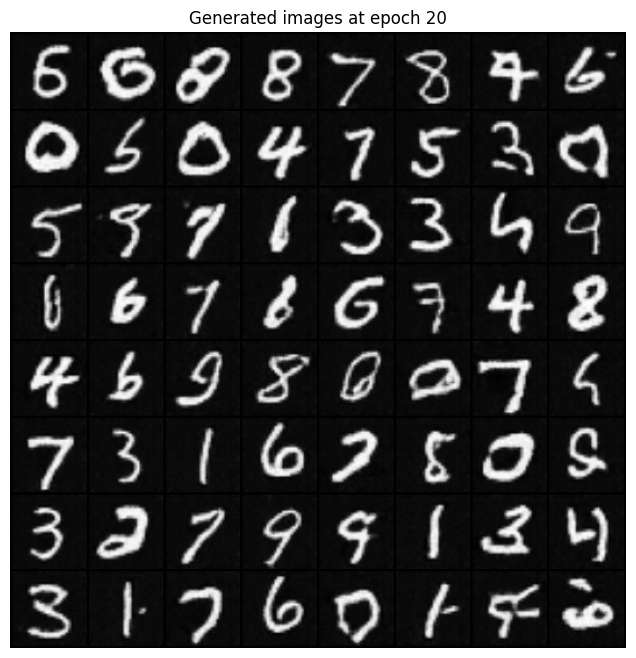

[21/25][0/469] Loss_D: 0.5368 Loss_G: 4.6192 D(x): 0.9811 D(G(z)): 0.3633 / 0.0148
[21/25][100/469] Loss_D: 0.2940 Loss_G: 3.4181 D(x): 0.8852 D(G(z)): 0.1429 / 0.0476
[21/25][200/469] Loss_D: 1.0928 Loss_G: 4.2172 D(x): 0.9703 D(G(z)): 0.5966 / 0.0216
[21/25][300/469] Loss_D: 0.0768 Loss_G: 4.2179 D(x): 0.9838 D(G(z)): 0.0576 / 0.0199
[21/25][400/469] Loss_D: 0.0306 Loss_G: 4.4370 D(x): 0.9849 D(G(z)): 0.0150 / 0.0173


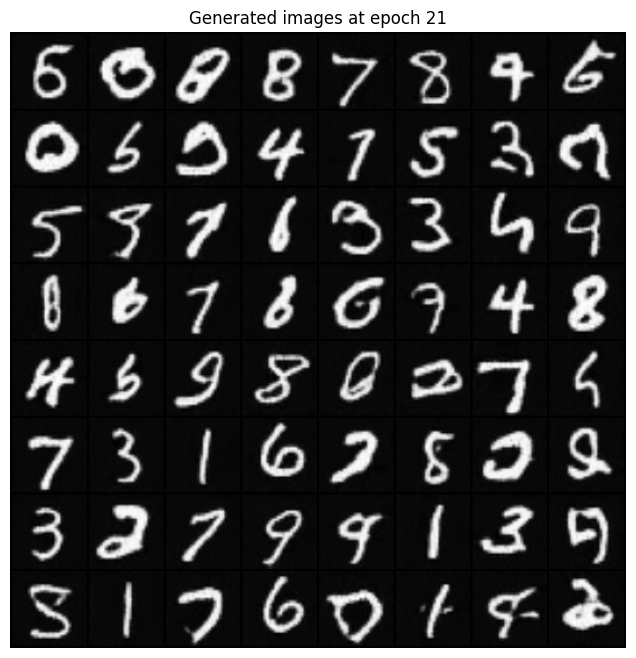

[22/25][0/469] Loss_D: 0.0299 Loss_G: 4.7980 D(x): 0.9897 D(G(z)): 0.0190 / 0.0128
[22/25][100/469] Loss_D: 0.0874 Loss_G: 3.5228 D(x): 0.9653 D(G(z)): 0.0486 / 0.0410
[22/25][200/469] Loss_D: 0.2061 Loss_G: 3.9199 D(x): 0.9699 D(G(z)): 0.1465 / 0.0287
[22/25][300/469] Loss_D: 0.0347 Loss_G: 4.9708 D(x): 0.9702 D(G(z)): 0.0040 / 0.0104
[22/25][400/469] Loss_D: 0.9643 Loss_G: 1.1210 D(x): 0.5633 D(G(z)): 0.2784 / 0.3586


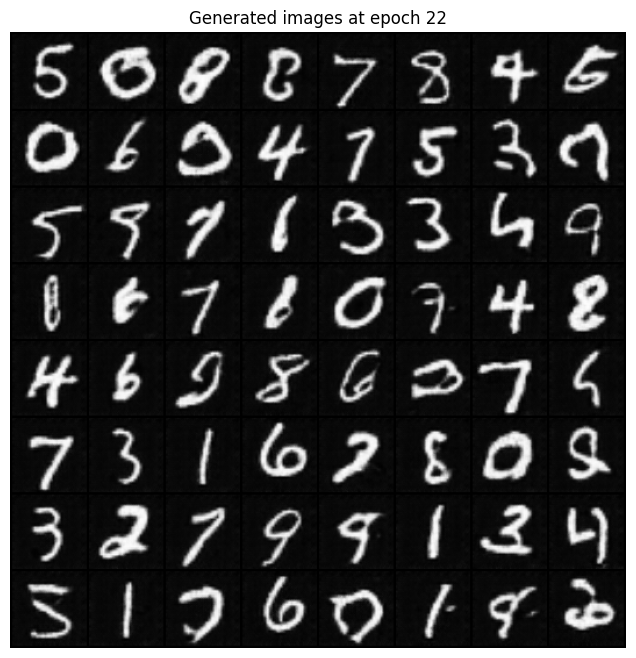

[23/25][0/469] Loss_D: 0.8608 Loss_G: 1.7144 D(x): 0.5928 D(G(z)): 0.2066 / 0.2308
[23/25][100/469] Loss_D: 0.1775 Loss_G: 3.4968 D(x): 0.9313 D(G(z)): 0.0905 / 0.0467
[23/25][200/469] Loss_D: 0.8061 Loss_G: 3.7788 D(x): 0.8719 D(G(z)): 0.4315 / 0.0320
[23/25][300/469] Loss_D: 0.0750 Loss_G: 4.1292 D(x): 0.9573 D(G(z)): 0.0295 / 0.0247
[23/25][400/469] Loss_D: 0.0283 Loss_G: 4.5306 D(x): 0.9904 D(G(z)): 0.0183 / 0.0152


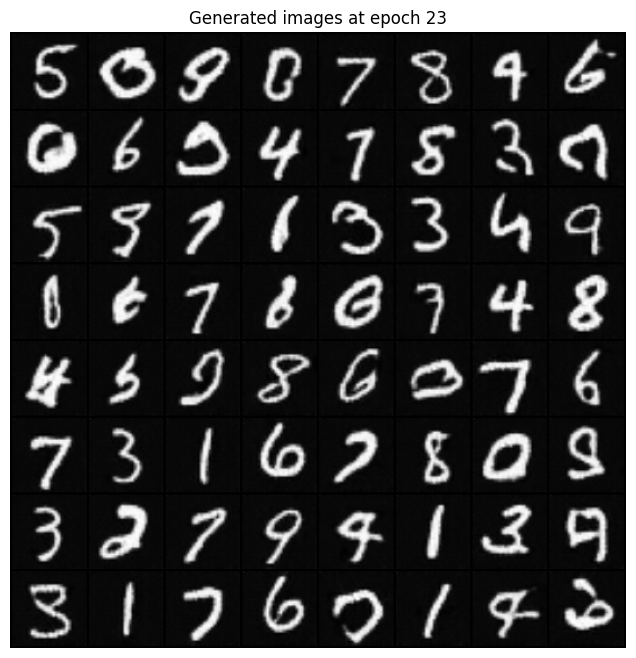

[24/25][0/469] Loss_D: 0.0175 Loss_G: 5.3192 D(x): 0.9889 D(G(z)): 0.0063 / 0.0073
[24/25][100/469] Loss_D: 0.3763 Loss_G: 2.4111 D(x): 0.8682 D(G(z)): 0.1927 / 0.1165
[24/25][200/469] Loss_D: 0.1875 Loss_G: 5.3821 D(x): 0.9831 D(G(z)): 0.1439 / 0.0071
[24/25][300/469] Loss_D: 1.0505 Loss_G: 1.6443 D(x): 0.4530 D(G(z)): 0.1084 / 0.2536
[24/25][400/469] Loss_D: 0.0337 Loss_G: 4.3874 D(x): 0.9888 D(G(z)): 0.0217 / 0.0200


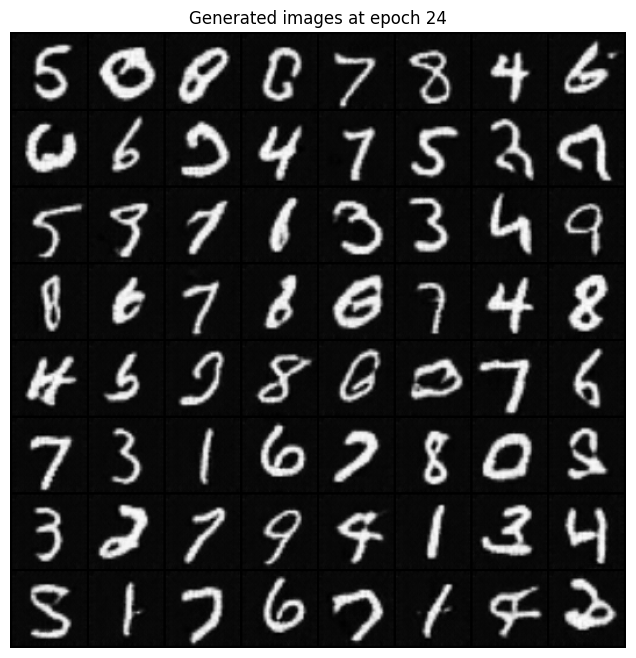

[25/25][0/469] Loss_D: 0.0261 Loss_G: 4.9789 D(x): 0.9928 D(G(z)): 0.0184 / 0.0102
[25/25][100/469] Loss_D: 1.0189 Loss_G: 0.8917 D(x): 0.5531 D(G(z)): 0.2998 / 0.4344
[25/25][200/469] Loss_D: 0.2191 Loss_G: 3.4933 D(x): 0.9290 D(G(z)): 0.1243 / 0.0468
[25/25][300/469] Loss_D: 0.6977 Loss_G: 2.4327 D(x): 0.7153 D(G(z)): 0.2437 / 0.1261
[25/25][400/469] Loss_D: 0.0435 Loss_G: 4.8598 D(x): 0.9920 D(G(z)): 0.0339 / 0.0111


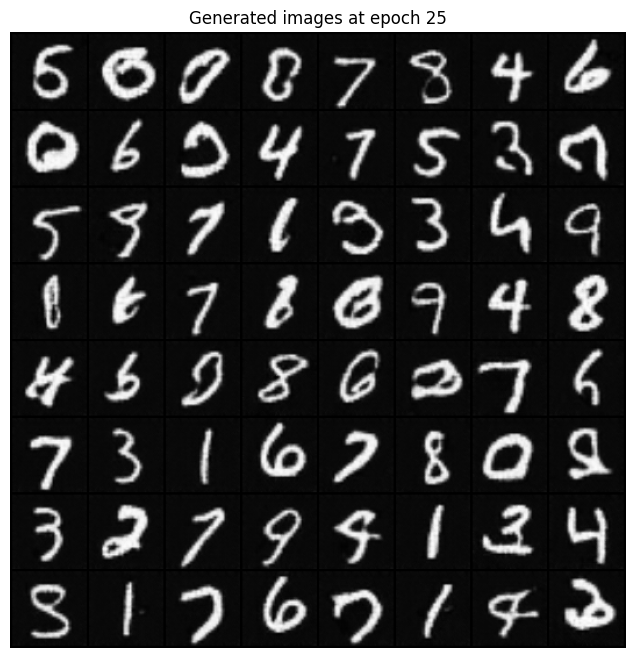

In [24]:
for epoch in range(num_epochs):
    for i, (data, _) in enumerate(dataloader):
        # 1. Update Discriminator: maximize log(D(x)) + log(1 - D(G(z)))
        netD.zero_grad()
        real_images = data.to(device)
        b_size = real_images.size(0)
        label = torch.full((b_size,), real_label, device=device)

        # Forward pass real batch through discriminator
        output = netD(real_images)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        # Generate fake images batch with generator
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake_images = netG(noise)
        label.fill_(fake_label)

        # Classify all fake batch with discriminator
        output = netD(fake_images.detach())  # detach to avoid training generator on these labels
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute discriminator loss and update
        errD = errD_real + errD_fake
        optimizerD.step()

        # 2. Update Generator: maximize log(D(G(z))) <=> minimize log(1 - D(G(z))) in practice
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost

        output = netD(fake_images)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # Print training stats occasionally
        if i % 100 == 0:
            print(f"[{epoch+1}/{num_epochs}][{i}/{len(dataloader)}] "
                  f"Loss_D: {errD.item():.4f} Loss_G: {errG.item():.4f} "
                  f"D(x): {D_x:.4f} D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}")

    # Visualize generated images after each epoch
    with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title(f"Generated images at epoch {epoch+1}")
    plt.imshow(np.transpose(make_grid(fake, padding=2, normalize=True), (1,2,0)))
    plt.show()

___